# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly as ply
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('train_data.csv',nrows=50000)
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (50000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades PreK-2,Applied Learning,Early Development,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,We need a classroom rug that we can use as a c...,"Benjamin Franklin once said, \""Tell me and I f...",My students need flexible seating in the class...,2,1
41558,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,Mrs.,WA,2016-04-27 01:05:25,Grades 3-5,Literacy & Language,Literacy,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",With the new common core standards that have b...,These remarkable gifts will provide students w...,My students need copies of the New York Times ...,2,1


In [5]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [6]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [7]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [8]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [9]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades PreK-2,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,We need a classroom rug that we can use as a c...,"Benjamin Franklin once said, \""Tell me and I f...",My students need flexible seating in the class...,2,1,AppliedLearning,EarlyDevelopment,I recently read an article about giving studen...
41558,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,Mrs.,WA,2016-04-27 01:05:25,Grades 3-5,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",With the new common core standards that have b...,These remarkable gifts will provide students w...,My students need copies of the New York Times ...,2,1,Literacy_Language,Literacy,"My students crave challenge, they eat obstacle..."


In [10]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [11]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)

I recently read an article about giving students a choice about how they learn. We already set goals; why not let them choose where to sit, and give them options of what to sit on?I teach at a low-income (Title 1) school. Every year, I have a class with a range of abilities, yet they are all the same age. They learn differently, and they have different interests. Some have ADHD, and some are fast learners. Yet they are eager and active learners that want and need to be able to move around the room, yet have a place that they can be comfortable to complete their work.We need a classroom rug that we can use as a class for reading time, and students can use during other learning times. I have also requested four Kore Kids wobble chairs and four Back Jack padded portable chairs so that students can still move during whole group lessons without disrupting the class. Having these areas will provide these little ones with a way to wiggle while working.Benjamin Franklin once said, \"Tell me an

In [12]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [13]:
sent = decontracted(project_data['essay'].values[20000])

In [14]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')

In [15]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)

In [16]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [17]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())
project_data['preprocessed_essays'] = preprocessed_essays

100%|██████████████████████████████████████████████████████████████████████████| 50000/50000 [00:26<00:00, 1862.59it/s]


### Number of words in combined Essay - Adding a new feature

In [18]:
# after preprocesing
proj_essay_wrd_count = []

for word in project_data['preprocessed_essays']:
    proj_essay_wrd_count.append(len(word.split()))
project_data['proj_essay_wrd_count'] = proj_essay_wrd_count

project_data.head(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades PreK-2,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,We need a classroom rug that we can use as a c...,"Benjamin Franklin once said, \""Tell me and I f...",My students need flexible seating in the class...,2,1,AppliedLearning,EarlyDevelopment,I recently read an article about giving studen...,recently read article giving students choice l...,114
41558,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,Mrs.,WA,2016-04-27 01:05:25,Grades 3-5,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",With the new common core standards that have b...,These remarkable gifts will provide students w...,My students need copies of the New York Times ...,2,1,Literacy_Language,Literacy,"My students crave challenge, they eat obstacle...",students crave challenge eat obstacles breakfa...,101
29891,146723,p099708,c0a28c79fe8ad5810da49de47b3fb491,Mrs.,CA,2016-04-27 01:10:09,Grades 3-5,Breakout Box to Ignite Engagement!,It's the end of the school year. Routines have...,"My students desire challenges, movement, and c...",I will design different clues using specific c...,Donations to this project will immediately imp...,"My students need items from a \""Breakout Box\""...",6,1,Math_Science History_Civics,Mathematics SocialSciences,It's the end of the school year. Routines have...,end school year routines run course students n...,147


<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [19]:
# printing some random essays.
print(project_data['project_title'].values[0])
print("="*50)
print(project_data['project_title'].values[150])
print("="*50)
print(project_data['project_title'].values[1000])

Flexible Seating for Flexible Learning
Elmo for Math Instruction
Comfy Carpet for Creative Learning


In [20]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_titles.append(sent.lower().strip())
project_data['preprocessed_titles'] = preprocessed_titles

100%|█████████████████████████████████████████████████████████████████████████| 50000/50000 [00:01<00:00, 38411.27it/s]


## Project title word count

In [21]:
proj_title_wrd_count = []

for word in project_data['preprocessed_titles']:
    proj_title_wrd_count.append(len(word.split()))
project_data['proj_title_wrd_count'] = proj_title_wrd_count
project_data.head(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count,preprocessed_titles,proj_title_wrd_count
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades PreK-2,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,...,My students need flexible seating in the class...,2,1,AppliedLearning,EarlyDevelopment,I recently read an article about giving studen...,recently read article giving students choice l...,114,flexible seating flexible learning,4
41558,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,Mrs.,WA,2016-04-27 01:05:25,Grades 3-5,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",...,My students need copies of the New York Times ...,2,1,Literacy_Language,Literacy,"My students crave challenge, they eat obstacle...",students crave challenge eat obstacles breakfa...,101,going deep the art inner thinking,6
29891,146723,p099708,c0a28c79fe8ad5810da49de47b3fb491,Mrs.,CA,2016-04-27 01:10:09,Grades 3-5,Breakout Box to Ignite Engagement!,It's the end of the school year. Routines have...,"My students desire challenges, movement, and c...",...,"My students need items from a \""Breakout Box\""...",6,1,Math_Science History_Civics,Mathematics SocialSciences,It's the end of the school year. Routines have...,end school year routines run course students n...,147,breakout box ignite engagement,4


## 1.4.1 Project_grade preprocessing

In [22]:
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace(" ", "_")
project_data['project_grade_category'].value_counts()

Grades_PreK-2    20316
Grades_3-5       16968
Grades_6-8        7750
Grades_9-12       4966
Name: project_grade_category, dtype: int64

### Preprocessing teacher_prefix

In [23]:
project_data['teacher_prefix'] = project_data['teacher_prefix'].str.replace(".","")

#Dropping the 2 rows from the data where the 'teacher_prefix' is NAN
project_data = project_data.dropna(subset=['teacher_prefix'])

project_data['teacher_prefix'].value_counts(dropna=False)

Mrs        26140
Ms         17936
Mr          4859
Teacher     1061
Dr             2
Name: teacher_prefix, dtype: int64

## 1.5 Preparing data for models

In [24]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay',
       'preprocessed_essays', 'proj_essay_wrd_count', 'preprocessed_titles',
       'proj_title_wrd_count'],
      dtype='object')

we are going to consider

       
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - school_state : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - preprocessed_titles: text data
       - preprocessed_essays : text data

       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### Split data into Train and Test

In [25]:
Y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)

In [26]:
X = project_data
X.head(1)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count,preprocessed_titles,proj_title_wrd_count
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs,GA,2016-04-27 00:53:00,Grades_PreK-2,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,...,"Benjamin Franklin once said, \""Tell me and I f...",My students need flexible seating in the class...,2,AppliedLearning,EarlyDevelopment,I recently read an article about giving studen...,recently read article giving students choice l...,114,flexible seating flexible learning,4


In [27]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, stratify=Y)

### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

### One Hot Encode - Clean_Categories

In [28]:
# we use count vectorizer to convert the values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_categories'].values)


categories_one_hot_train = vectorizer.transform(X_train['clean_categories'].values)
categories_one_hot_test = vectorizer.transform(X_test['clean_categories'].values)

print("Shape of Train data - one hot encoding ",categories_one_hot_train.shape)
print("Shape of Test data - one hot encoding ",categories_one_hot_test.shape)

f_nm_cat = vectorizer.get_feature_names()
print(f_nm_cat)

Shape of Train data - one hot encoding  (33498, 9)
Shape of Test data - one hot encoding  (16500, 9)
['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']


### One Hot Encode - Clean_Sub-Categories

In [29]:
# we use count vectorizer to convert the values into one 

vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_subcategories'].values)

sub_cat_one_hot_train = vectorizer.transform(X_train['clean_subcategories'].values)
sub_cat_one_hot_test = vectorizer.transform(X_test['clean_subcategories'].values)


print("Shape of Train data - one hot encoding ",sub_cat_one_hot_train.shape)
print("Shape of Test data - one hot encoding",sub_cat_one_hot_test.shape)

f_nm_subcat = vectorizer.get_feature_names()
print(f_nm_subcat)

Shape of Train data - one hot encoding  (33498, 30)
Shape of Test data - one hot encoding (16500, 30)
['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']


### One Hot Encode - School_States

In [30]:
my_counter = Counter()
for state in project_data['school_state'].values:
    my_counter.update(state.split())

In [31]:
school_state_cat_dict = dict(my_counter)
sorted_school_state_cat_dict = dict(sorted(school_state_cat_dict.items(), key=lambda kv: kv[1]))

In [32]:
## we use count vectorizer to convert the values into one hot encoded features

vectorizer = CountVectorizer(vocabulary=list(sorted_school_state_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['school_state'].values)

school_state_one_hot_train = vectorizer.transform(X_train['school_state'].values)
school_state_one_hot_test = vectorizer.transform(X_test['school_state'].values)


print("Shape of Train data - one hot encoding",school_state_one_hot_train.shape)
print("Shape of Test data - one hot encoding",school_state_one_hot_test.shape)

f_nm_ss = vectorizer.get_feature_names()
print(f_nm_ss)

Shape of Train data - one hot encoding (33498, 51)
Shape of Test data - one hot encoding (16500, 51)
['VT', 'WY', 'ND', 'MT', 'RI', 'NH', 'SD', 'NE', 'AK', 'DE', 'WV', 'ME', 'NM', 'HI', 'DC', 'KS', 'ID', 'IA', 'AR', 'CO', 'MN', 'OR', 'MS', 'KY', 'NV', 'MD', 'TN', 'CT', 'AL', 'UT', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'MA', 'LA', 'WA', 'MO', 'IN', 'OH', 'PA', 'MI', 'GA', 'SC', 'IL', 'NC', 'FL', 'TX', 'NY', 'CA']


### One Hot Encode - Project_Grade_Category

In [33]:
my_counter = Counter()
for project_grade in project_data['project_grade_category'].values:
    my_counter.update(project_grade.split())

In [34]:
project_grade_cat_dict = dict(my_counter)
sorted_project_grade_cat_dict = dict(sorted(project_grade_cat_dict.items(), key=lambda kv: kv[1]))

In [35]:
## we use count vectorizer to convert the values into one hot encoded features

vectorizer = CountVectorizer(vocabulary=list(sorted_project_grade_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['project_grade_category'].values)

project_grade_cat_one_hot_train = vectorizer.transform(X_train['project_grade_category'].values)
project_grade_cat_one_hot_test = vectorizer.transform(X_test['project_grade_category'].values)


print("Shape of Train data - one hot encoding",project_grade_cat_one_hot_train.shape)
print("Shape of Test data - one hot encoding",project_grade_cat_one_hot_test.shape)

f_nm_pgc = vectorizer.get_feature_names()
print(f_nm_pgc)

Shape of Train data - one hot encoding (33498, 4)
Shape of Test data - one hot encoding (16500, 4)
['Grades_9-12', 'Grades_6-8', 'Grades_3-5', 'Grades_PreK-2']


### One Hot Encode - Teacher_Prefix

In [36]:
my_counter = Counter()
for teacher_prefix in project_data['teacher_prefix'].values:
    teacher_prefix = str(teacher_prefix)
    my_counter.update(teacher_prefix.split())

In [37]:
teacher_prefix_cat_dict = dict(my_counter)
sorted_teacher_prefix_cat_dict = dict(sorted(teacher_prefix_cat_dict.items(), key=lambda kv: kv[1]))

In [38]:
vectorizer = CountVectorizer(vocabulary=list(sorted_teacher_prefix_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['teacher_prefix'].values.astype("U"))

teacher_prefix_cat_one_hot_train = vectorizer.transform(X_train['teacher_prefix'].values.astype("U"))
teacher_prefix_cat_one_hot_test = vectorizer.transform(X_test['teacher_prefix'].values.astype("U"))

print("Shape of Train data - one hot encoding",teacher_prefix_cat_one_hot_train.shape)
print("Shape of Test data - one hot encoding ",teacher_prefix_cat_one_hot_test.shape)

f_nm_tp = vectorizer.get_feature_names()
print(f_nm_tp)
teacher_prefix_cat_dict

Shape of Train data - one hot encoding (33498, 5)
Shape of Test data - one hot encoding  (16500, 5)
['Dr', 'Teacher', 'Mr', 'Ms', 'Mrs']


{'Mrs': 26140, 'Ms': 17936, 'Mr': 4859, 'Teacher': 1061, 'Dr': 2}

### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

#### BOW of eassys - Train/Test Data

In [39]:
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(X_train['preprocessed_essays'])

#BOW for essays Train Data
essay_bow_train = vectorizer.transform(X_train['preprocessed_essays'])
print("Shape of matrix for TRAIN data ",essay_bow_train.shape)
f_nm_bow_eassy_tr = vectorizer.get_feature_names()#Storing the names of the BOW train feature data.
print(f_nm_bow_eassy_tr[10:50])

#BOW for essays Test Data
essay_bow_test = vectorizer.transform(X_test['preprocessed_essays'])
print("Shape of matrix for TEST data",essay_bow_test.shape)

Shape of matrix for TRAIN data  (33498, 10306)
['1100', '115', '11th', '12', '120', '1200', '125', '12th', '13', '130', '14', '140', '1400', '15', '150', '1500', '16', '160', '1600', '17', '170', '1700', '18', '180', '19', '1st', '20', '200', '2000', '2003', '2004', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014']
Shape of matrix for TEST data (16500, 10306)


#### BOW of Project Titles - Train/Test Data¶

In [40]:
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(X_train['preprocessed_titles'])

# BOW for title Train Data
title_bow_train = vectorizer.transform(X_train['preprocessed_titles'])
print("Shape of matrix for TRAIN data ",title_bow_train.shape)
f_nm_bow_title_tr = vectorizer.get_feature_names()#Storing the names of the BOW train feature data.
print(f_nm_bow_title_tr[10:50])

# BOW for title Test Data
title_bow_test = vectorizer.transform(X_test['preprocessed_titles'])
print("Shape of matrix for TEST data",title_bow_test.shape)

Shape of matrix for TRAIN data  (33498, 1608)
['2nd', '3d', '3doodler', '3doodlers', '3rd', '4th', '5th', '60', '6th', '7th', '8th', 'abc', 'about', 'academic', 'academics', 'access', 'accessible', 'accessing', 'accessories', 'achieve', 'achievement', 'across', 'act', 'action', 'active', 'actively', 'activities', 'activity', 'add', 'adding', 'advanced', 'adventure', 'adventures', 'after', 'again', 'age', 'ahead', 'aids', 'air', 'algebra']
Shape of matrix for TEST data (16500, 1608)


#### TFIDF vectorizer for essay

In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
vectorizer.fit(X_train['preprocessed_essays'])

#tidf Train Data
essay_tfidf_train = vectorizer.transform(X_train['preprocessed_essays'])
print("Shape of matrix for TRAIN data",essay_tfidf_train.shape)
f_nm_tidf_eassy_tr = vectorizer.get_feature_names()#Storing the names of the BOW train feature data.
print(f_nm_tidf_eassy_tr[10:50])

#tidf Test Data
essay_tfidf_test = vectorizer.transform(X_test['preprocessed_essays'])
print("Shape of matrix for TEST data",essay_tfidf_test.shape)

Shape of matrix for TRAIN data (33498, 10306)
['1100', '115', '11th', '12', '120', '1200', '125', '12th', '13', '130', '14', '140', '1400', '15', '150', '1500', '16', '160', '1600', '17', '170', '1700', '18', '180', '19', '1st', '20', '200', '2000', '2003', '2004', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014']
Shape of matrix for TEST data (16500, 10306)


#### TFIDF vectorizer for Title

In [42]:
vectorizer = TfidfVectorizer(min_df=10)
vectorizer.fit(X_train['preprocessed_titles'])

#tidf Train Data
title_tfidf_train = vectorizer.transform(X_train['preprocessed_titles'])
print("Shape of matrix for TRAIN data",title_tfidf_train.shape)
f_nm_tidf_title_tr = vectorizer.get_feature_names()#Storing the names of the BOW train feature data.
print(f_nm_tidf_title_tr[10:50])


#tidf Test Data
title_tfidf_test = vectorizer.transform(X_test['preprocessed_titles'])
print("Shape of matrix for TEST data",title_tfidf_test.shape)

Shape of matrix for TRAIN data (33498, 1608)
['2nd', '3d', '3doodler', '3doodlers', '3rd', '4th', '5th', '60', '6th', '7th', '8th', 'abc', 'about', 'academic', 'academics', 'access', 'accessible', 'accessing', 'accessories', 'achieve', 'achievement', 'across', 'act', 'action', 'active', 'actively', 'activities', 'activity', 'add', 'adding', 'advanced', 'adventure', 'adventures', 'after', 'again', 'age', 'ahead', 'aids', 'air', 'algebra']
Shape of matrix for TEST data (16500, 1608)


In [43]:
vectorizer.idf_

array([8.71122067, 8.47483189, 8.78021354, ..., 8.93436422, 8.52889911,
       8.42353859])

### 1.5.3 Vectorizing Numerical features

In [44]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(3)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21
2,p000003,298.97,4


In [45]:
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left')

In [46]:
from sklearn.preprocessing import Normalizer

normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['price'].values.reshape(-1,1))

price_data_train = normalizer.transform(X_train['price'].values.reshape(-1,1))

price_data_test = normalizer.transform(X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print("="*100)
print(price_data_train.shape, Y_train.shape)
print(price_data_test.shape, Y_test.shape)

print("="*100)

After vectorizations
(33498, 1) (33498,)
(16500, 1) (16500,)


#### Vectorizing Quantity Feature

In [47]:
normalizer = Normalizer()

normalizer.fit(X_train['quantity'].values.reshape(-1,1))

quant_train = normalizer.transform(X_train['quantity'].values.reshape(-1,1))
quant_test = normalizer.transform(X_test['quantity'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(quant_train.shape, Y_train.shape)
print(quant_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(33498, 1) (33498,)
(16500, 1) (16500,)


####  Vectorizing teacher_number_of_previously_posted_projects 

In [48]:
normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

prev_no_projects_train = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
prev_no_projects_test = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(prev_no_projects_train.shape, Y_train.shape)
print(prev_no_projects_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(33498, 1) (33498,)
(16500, 1) (16500,)


### Vectorising the Word count of title feature

In [49]:
normalizer = Normalizer()

normalizer.fit(X_train['proj_title_wrd_count'].values.reshape(-1,1))

title_cnt_train = normalizer.transform(X_train['proj_title_wrd_count'].values.reshape(-1,1))
title_cnt_test = normalizer.transform(X_test['proj_title_wrd_count'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(title_cnt_train.shape, Y_train.shape)
print(title_cnt_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(33498, 1) (33498,)
(16500, 1) (16500,)


### Vectorising the Word count of Essay feature

In [50]:
normalizer = Normalizer()

normalizer.fit(X_train['proj_title_wrd_count'].values.reshape(-1,1))

essay_cnt_train = normalizer.transform(X_train['proj_essay_wrd_count'].values.reshape(-1,1))
essay_cnt_test = normalizer.transform(X_test['proj_essay_wrd_count'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(essay_cnt_train.shape, Y_train.shape)
print(essay_cnt_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(33498, 1) (33498,)
(16500, 1) (16500,)


# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

<h1>2. Clustering</h1>

### Select 5k best features from features usinf decision tree using feature_importances_, discard all the other remaining features

In [51]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_train_merge = hstack((categories_one_hot_train, sub_cat_one_hot_train, school_state_one_hot_train, project_grade_cat_one_hot_train, teacher_prefix_cat_one_hot_train, price_data_train, quant_train, prev_no_projects_train,essay_tfidf_train)).tocsr()
X_test_merge = hstack((categories_one_hot_test, sub_cat_one_hot_test, school_state_one_hot_test, project_grade_cat_one_hot_test, teacher_prefix_cat_one_hot_test, price_data_test, quant_test, prev_no_projects_test,essay_tfidf_test)).tocsr()

print("Final Data matrix")
print("="*100)
print(X_train_merge.shape, Y_train.shape)
print(X_test_merge.shape, Y_test.shape)
print("="*100)

Final Data matrix
(33498, 10408) (33498,)
(16500, 10408) (16500,)


In [52]:
from itertools import chain 
feature_names_tfidf = []
#https://www.geeksforgeeks.org/python-append-multiple-lists-at-once/

feature_names_tfidf = list(chain(f_nm_cat,f_nm_subcat,f_nm_ss,f_nm_pgc,f_nm_tp,["Price","Quantity","Prec_no_projts"],f_nm_tidf_eassy_tr))

In [53]:
#https://datascience.stackexchange.com/questions/31406/tree-decisiontree-feature-importances-numbers-correspond-to-how-features

from sklearn.tree import DecisionTreeClassifier
import pandas as pd

clf = DecisionTreeClassifier()

df_tfidf_5k = pd.DataFrame(X_train_merge.todense())
df_tfidf_5k.columns = feature_names_tfidf

clf = clf.fit(df_tfidf_5k,Y_train)

In [54]:
#https://datascience.stackexchange.com/questions/31406/tree-decisiontree-feature-importances-numbers-correspond-to-how-features
tfidf_5k_fimpt = {}
tfidf_5k_fimpt = dict(zip(feature_names_tfidf, clf.feature_importances_))

#https://stackoverflow.com/questions/613183/how-do-i-sort-a-dictionary-by-value
#Sort the dict in the descending order based on the values in the dictrionary
tfidf_5k_fimpt = sorted(tfidf_5k_fimpt.items(), key=lambda x: x[1], reverse=True)

#https://stackoverflow.com/questions/12142133/how-to-get-first-element-in-a-list-of-tuples
#To get the first value of a tuple from a list of tuples and removed the features wih zero feature importance value.
tfidf_5k_fimpt = [ seq[0] for seq in tfidf_5k_fimpt if seq[1] > 0.0 ]

tfidf_5k_fimpt = tfidf_5k_fimpt[:5000]
df_tfidf_5k = df_tfidf_5k[tfidf_5k_fimpt]
df_tfidf_5k.head()

,materials,nannan,reading,supplies,learn,classroom,use,want,not,students,...,sticky,coding,urge,experts,wimpy,compositions,experiences,ollie,wish,meet
0,0.000000,0.000000,0.0,0.0,0.000000,0.058809,0.075435,0.000000,0.000000,0.063829,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
1,0.038097,0.016955,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.023530,0.179888,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
2,0.000000,0.018461,0.0,0.0,0.103428,0.172268,0.000000,0.036452,0.025621,0.142455,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
3,0.000000,0.018626,0.0,0.0,0.078261,0.074485,0.000000,0.000000,0.000000,0.125756,...,0.0,0.0,0.0,0.0,0.0,0.0,0.051481,0.0,0.0,0.057658
4,0.000000,0.022925,0.0,0.0,0.000000,0.030560,0.039199,0.000000,0.031816,0.110561,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000


### Finding the optimum value of clusters using the elbow method

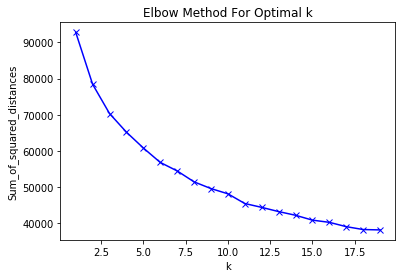

In [56]:
#https://blog.cambridgespark.com/how-to-determine-the-optimal-number-of-clusters-for-k-means-clustering-14f27070048f
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import cmath as math
import sys

Sum_of_squared_distances = []

K = range(1,20)

#Find the K-Mean for each value of K in range(2,5).
for k in K:
    km = KMeans(n_clusters=k,init = 'k-means++')
    km = km.fit(df_tfidf_5k)
    Sum_of_squared_distances.append(km.inertia_)
    
#Plot the (K vs inertia_) plot  and then from the plot find the optimum no of clusters using the knee/elbow method.

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

#### Observation :
The elbow/knee point as visbile manually is at K=12 , so we consider it as the optimal value of K to execute the K-means Algorithm.

### Finding the cluster count and the word cloud

In [56]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
model = KMeans(n_clusters = 12 , n_jobs = -1)
model.fit(df_tfidf_5k)

# Getting the cluster labels
clust_labels = model.labels_

# Centroid values converting to numpy array.
cent = np.array(model.cluster_centers_)

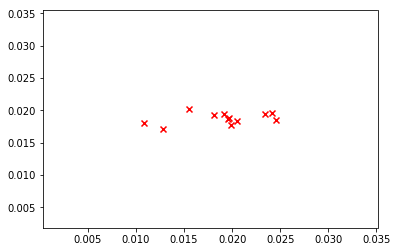

In [57]:
#https://pythonprogramminglanguage.com/kmeans-clustering-centroid/
#Plotting the centroids for the K-meean
plt.scatter(cent[:,0], cent[:,1], marker="x", color='r')

In [58]:
#Centroids of the clusters
model.cluster_centers_

array([[1.08439907e-02, 1.80276044e-02, 6.22927361e-03, ...,
        1.80159754e-04, 1.95413831e-03, 7.30437969e-03],
       [1.95675672e-02, 1.87181411e-02, 3.45843456e-02, ...,
        9.89334482e-19, 1.35693047e-03, 5.66273507e-03],
       [1.55434396e-02, 2.01558222e-02, 3.00336190e-02, ...,
        1.08420217e-18, 1.05571430e-03, 9.77921101e-03],
       ...,
       [1.98468643e-02, 1.78046335e-02, 7.14933740e-03, ...,
        5.39458823e-05, 1.81969068e-03, 5.10533377e-03],
       [2.33824869e-02, 1.93864213e-02, 2.15583743e-02, ...,
        9.93837832e-05, 1.41354721e-03, 8.28451774e-03],
       [2.04814800e-02, 1.83715269e-02, 1.71785748e-02, ...,
        5.95849970e-05, 1.25280689e-03, 5.84448251e-03]])

#### Observation :
From the centroid plot it shows the clusters are not well seperated but very closed overlapping on each other.
This can be noticed from the word cloud aswell.

In [59]:
#Glue back to originaal data
df_tfidf_5k_tr = df_tfidf_5k

df_tfidf_5k_tr['clusters'] = clust_labels

feature_names_tfidf_tr = feature_names_tfidf
#Add the column into our list
feature_names_tfidf_tr.extend(['clusters'])

In [60]:
#Data Points per cluster.
CountStatus = pd.value_counts(df_tfidf_5k_tr['clusters'].values, sort=False)

In [63]:
t

,Cluster,Count
0,0,2003
1,1,1309
2,2,2095
3,3,2705
4,4,3821
5,5,2056
6,6,3211
7,7,2939
8,8,1980
9,9,3433


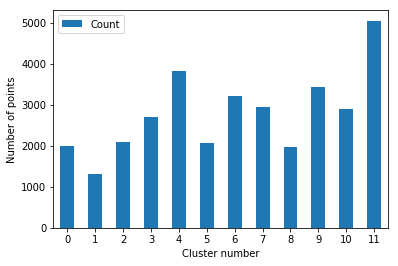

In [61]:
#Bar plot with counts of points in each cluster
t = pd.DataFrame({'Cluster': range(0,12),'Count':CountStatus})

ax = t.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

### Word Cloud for all the clusters

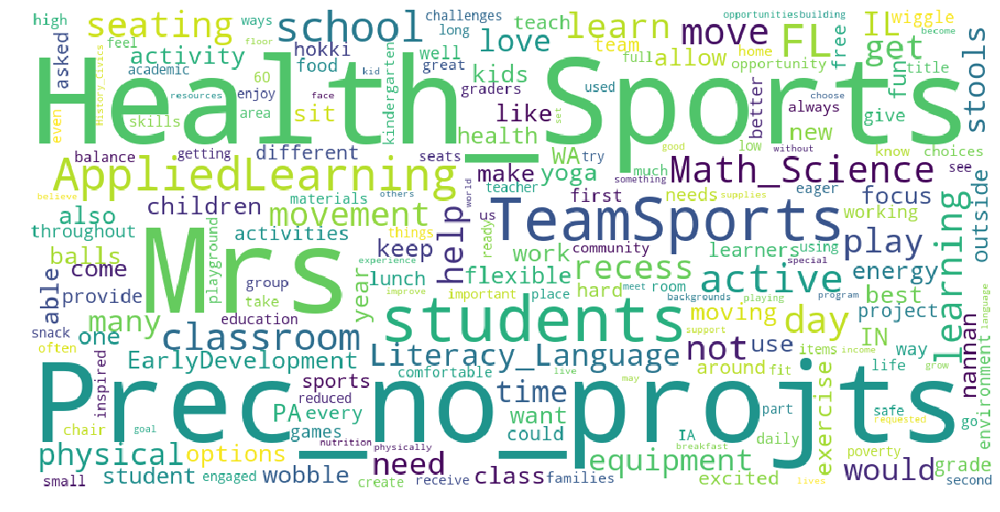

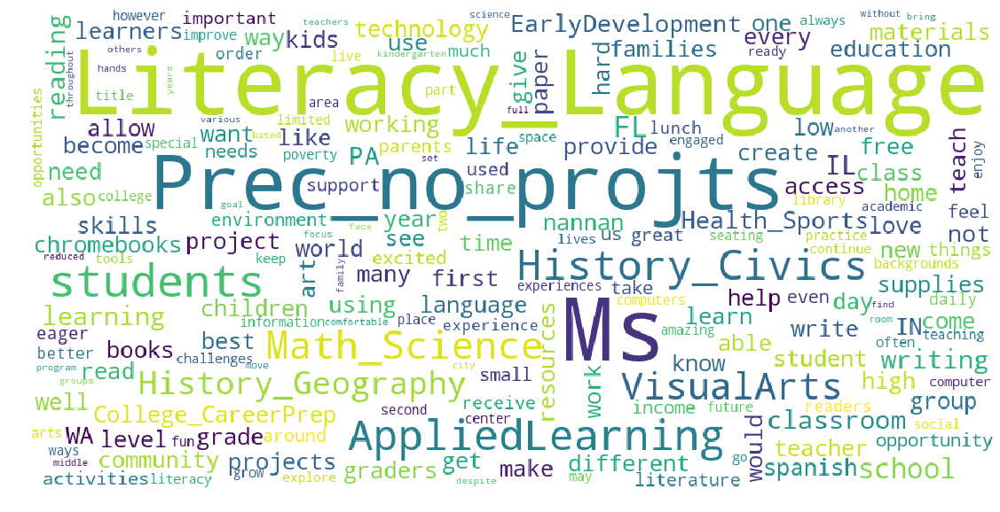

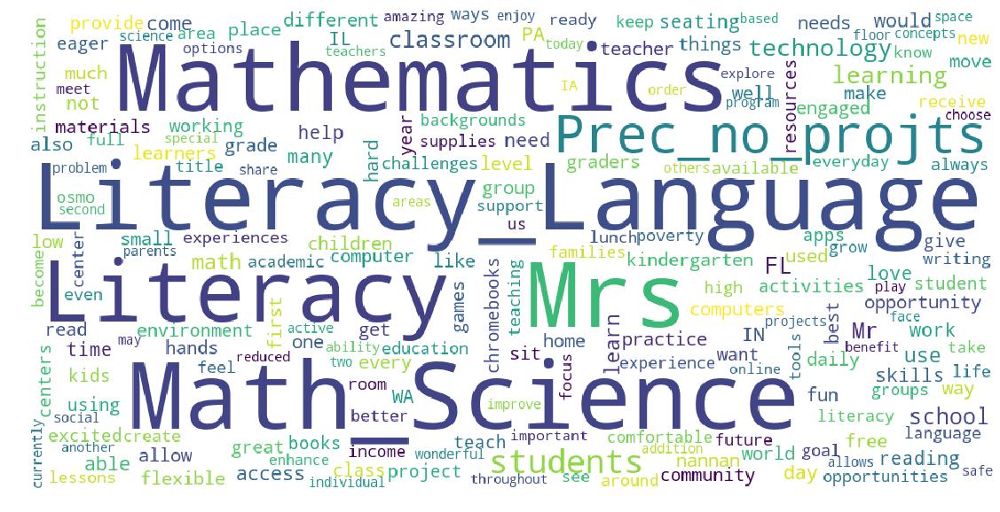

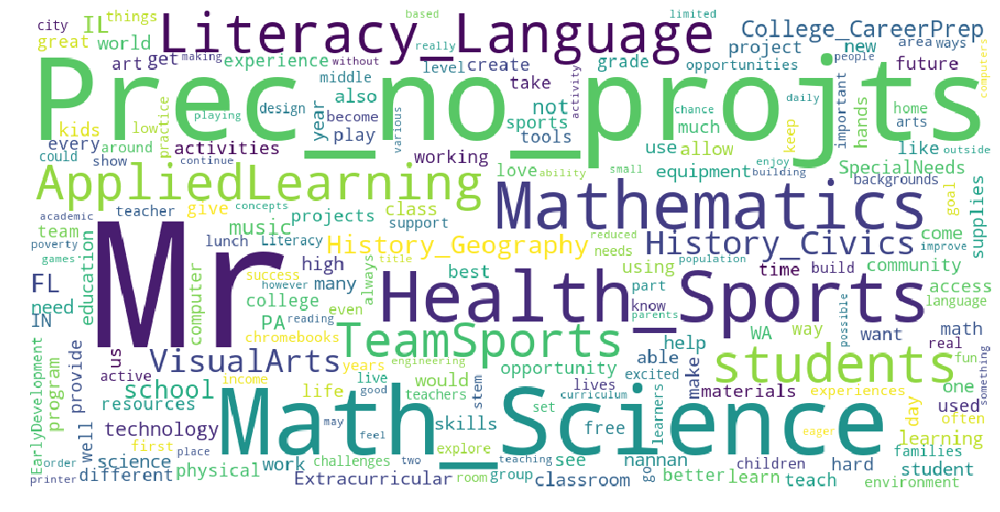

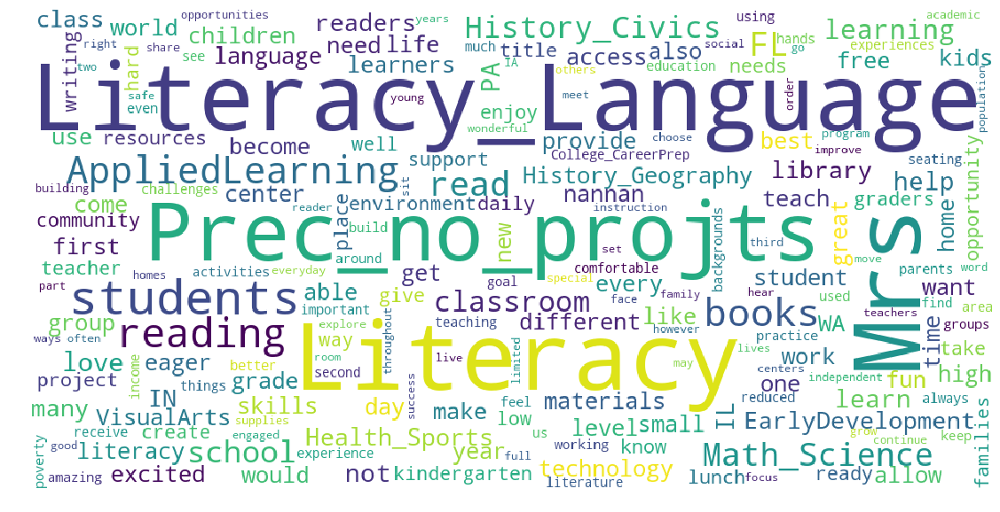

...

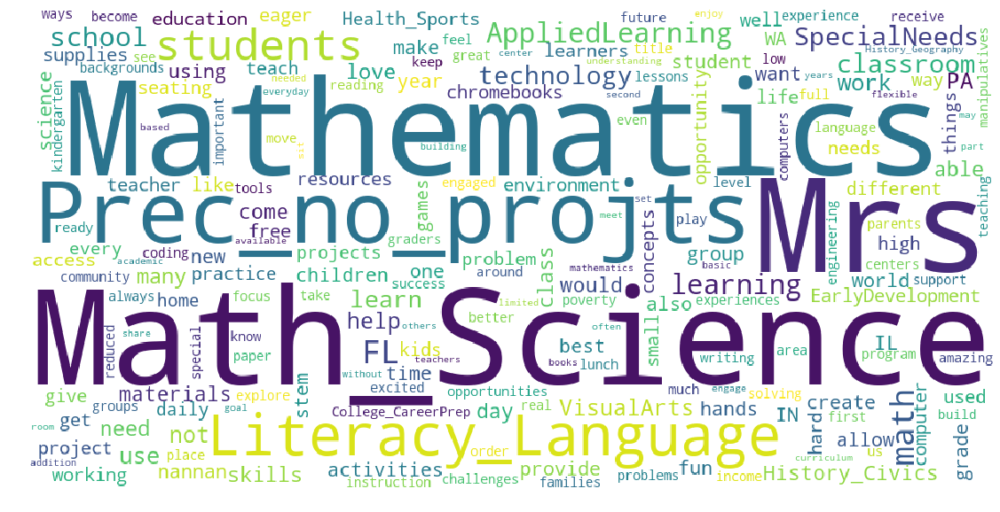

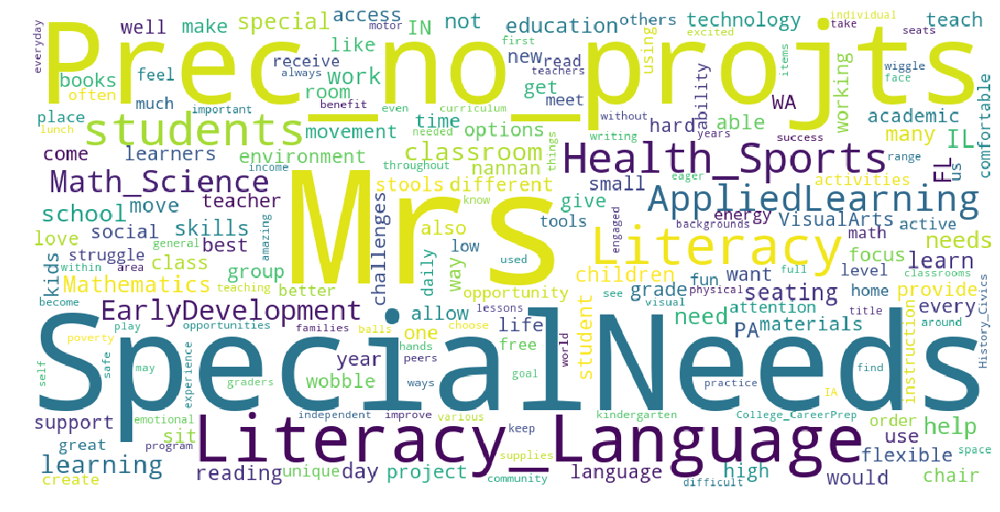

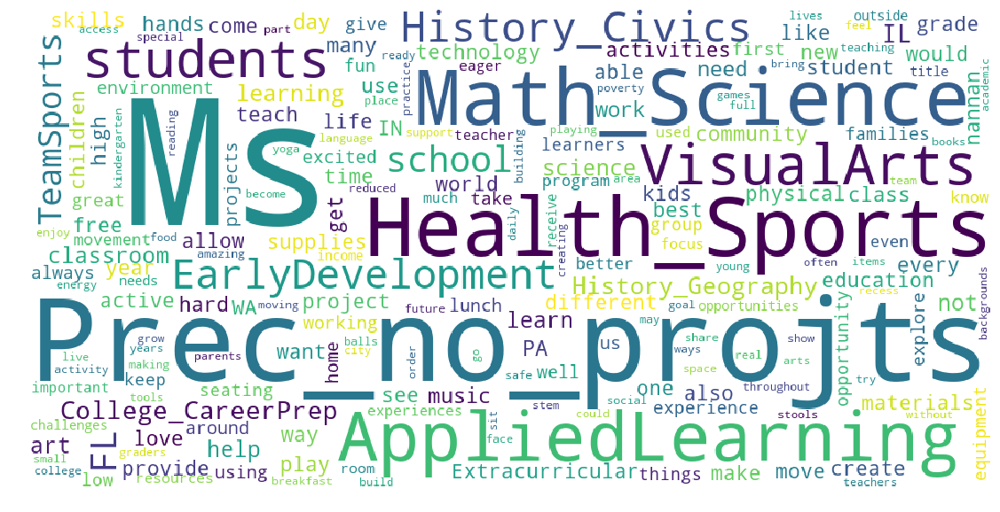

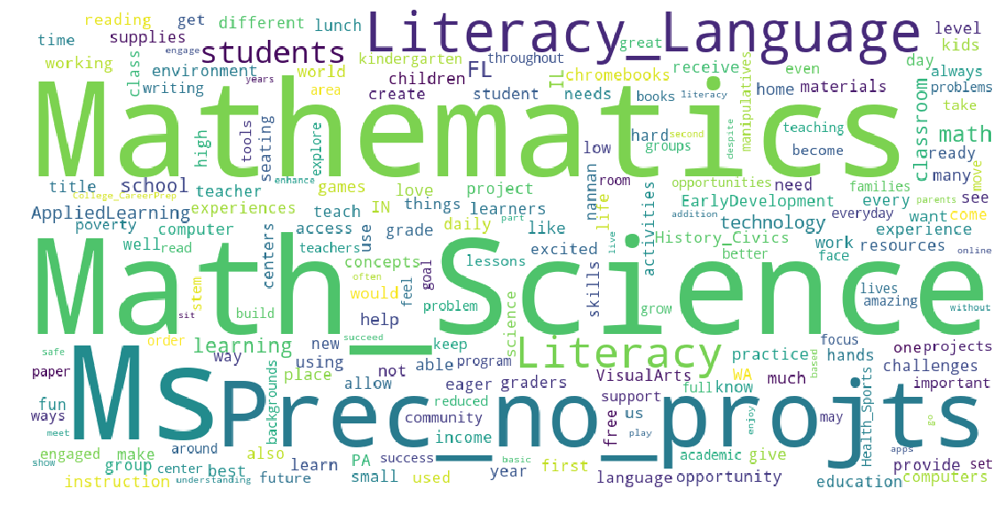

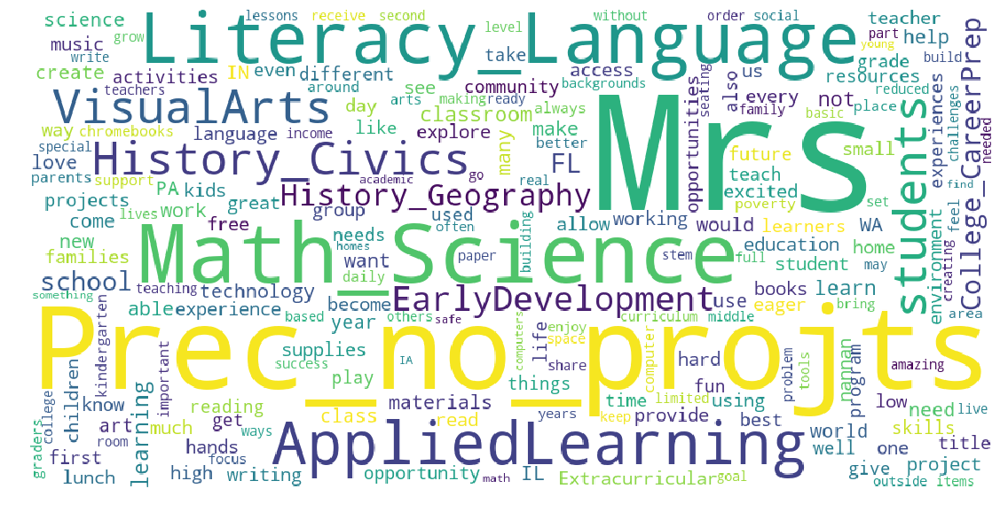

In [62]:
from wordcloud import WordCloud
#https://stackoverflow.com/questions/43606339/generate-word-cloud-from-single-column-pandas-dataframe

for i in range(0,12):
    clust = df_tfidf_5k_tr[df_tfidf_5k_tr['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

#### Observation : 

 Cluster-0 :
  - In cluster-0 , there are total 2003 data points are taken.
  - Most prominent words in the clusters are Health_Sports ,Team_Sports,MS,yoga,seating,acitivty,sports,active,
    play,energy,play,move,moving,recess,flexible,movement.
  - Here in this cluster it seems the words related to movement and sports are predominantly clustered.

Cluster-1:
  - In cluster-1 , there are total 1309 data points are taken.
  - Most prominent words in the clusters are History_Geography,History_Civics,AppliedLearning,VisualArts,Literacy_Language
  - Here in this cluster it seems words related to time like daily,history,first,second,year,day are used.
  
Cluster-3:
  - In cluster-3 , there are total 2095 data points are taken.
  - Most prominent words in the clusters are Math_Science , Mathematics ,Mrs,Prec_no_projts,Literacy_Language and Literacy.
  - Here in this cluster it seems words related to math,learning,grade and books etc are used more.
  
Cluster-4:
  - In cluster-4 , there are total 3821 data points are taken.
  - Most prominent words in the clusters are Health_Sports , Team_Sports ,mathematics,extracurricular,activities.
  - Here in this cluster it seems here words focused on extracurricular,activities,sports are clustered
  
Cluster-5:
   - In cluster-5 , there are total 2056 data points are taken.
  - Most prominent words in the clusters are literacy_language,literacy,students,reading,books,classrom,
    class,childrean,academics,learning,teacher,teach
  - Here in this cluster it seems words focused on teaching,student,reading,books etc are used more.
  
Cluster-6:
   - In cluster-6 , there are total 3211 data points are taken.
  - Most prominent words in the clusters are Special_Needs,Prec_no_projts,Literacy_Language and Literacy_Writing.
  - Here in this cluster it seems special needs ,needs like words are predominantly used.

Cluster-7:

- In cluster-7 , there are total 2939 data points are taken.
- Most prominent words in the clusters are Math_Science , Mathematics ,MS,Prec_no_projts,Literacy_Language,library,excited.
- Here in this cluster it seems the students who love reading and kids who need library.They are also excited for new skils and ready to work hard.These words are included in the cluster.

Cluster-8:

- In cluster-8 , there are total 1980 data points are taken.
- Most prominent words in the clusters are Math_Science , Mathematics ,MS,Prec_no_projts,Literacy_Language,MRS.
- Here in this cluster it seems the students who have family problem and income problem are these type of words are clustered in this.Also sudents with coding history and interest in sports are included in this clusters.

Cluster-9:

- In cluster-9 , there are total 3433 data points are taken.
- Most prominent words in the clusters are Math_Science , Mathematics ,MS,Prec_no_projts,Literacy_Language and Literacy_Writing.
- Here in this cluster it seems MATH and literature relates subjects are dominant.
- Mostly six words as mentioned are dominantly visible in the word cloud.

Cluster-10:

- In cluster-10 , there are total 2898 data points are taken.
- Most prominent words in the clusters are Math_Science , Mathematics ,MS,Prec_no_projts,Literacy_Language.
- Here in this cluster it seems there is a patern of words for free lunch and education are in this cluster and also support for poor families.

Cluster-11:

- In cluster-11 , there are total 5048 data points are taken.
- Most prominent words in the clusters are Literacy_Language,Math_Science,Applied_Learning,Visual_Arts etc.
- Here in this cluster it seems teaching technology and applied learning in the projects are in this clusters.

In [71]:
from sklearn.cluster import AgglomerativeClustering

amodel2 = AgglomerativeClustering(n_clusters = 2 ,affinity='euclidean',linkage='ward')
amodel2.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels2 = amodel2.labels_

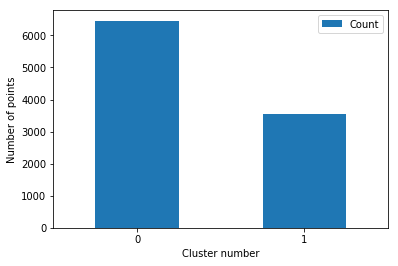

In [72]:
#Glue back to originaal data
df_tfidf_5k_tr_a = df_tfidf_5k[:10000]

df_tfidf_5k_tr_a['clusters'] = clust_labels2

#Data Points per cluster.
CountStatus2 = pd.value_counts(df_tfidf_5k_tr_a['clusters'].values, sort=False)

#Bar plot with counts of points in each cluster
t = pd.DataFrame({'Cluster': range(0,2),'Count':CountStatus2})

ax = t.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

### Word Cloud for the 2 clusters

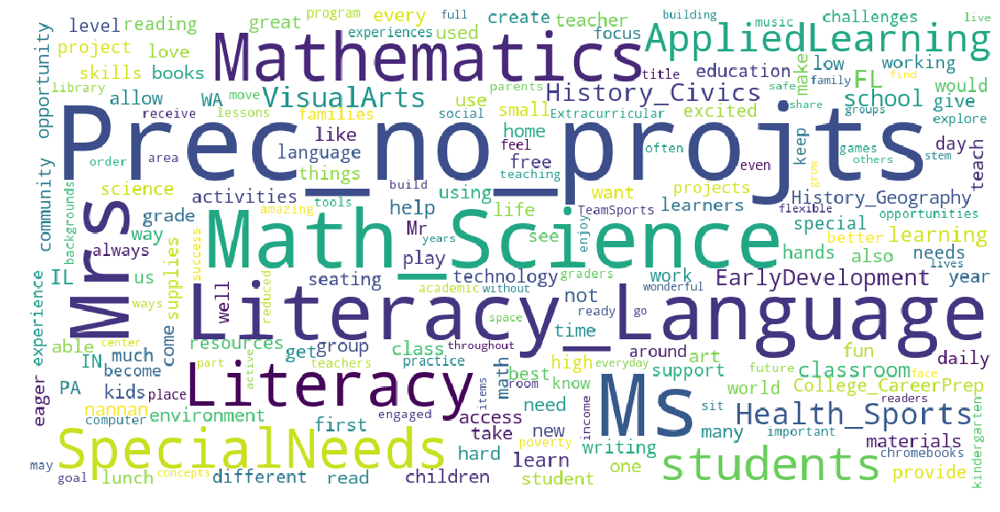

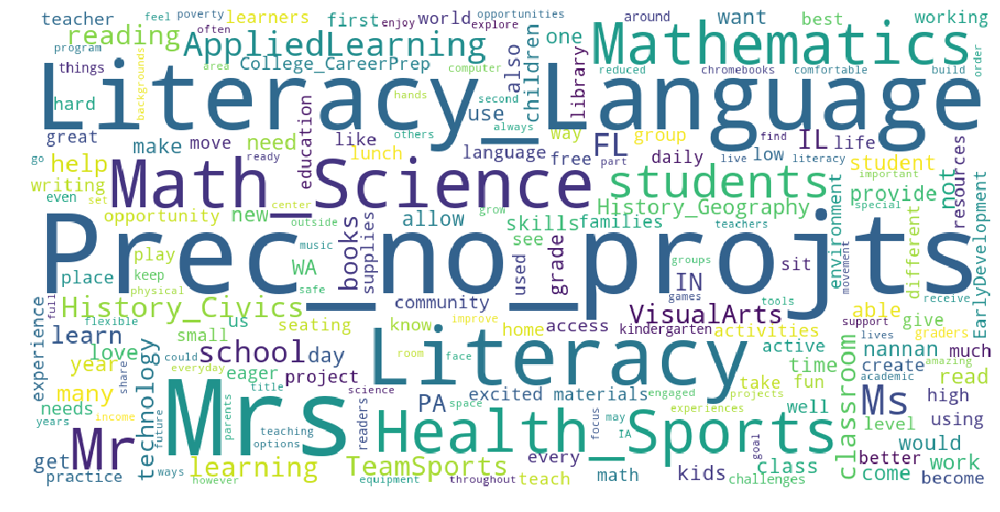

In [73]:
for i in range(0,2):
    clust = df_tfidf_5k_tr_a[df_tfidf_5k_tr_a['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

Cluster-0 :

- Most prominent words in the clusters are Special Needs,Health_Sports ,Team_Sports,MS,yoga,seating,acitivty,sports,active, -play,energy,play,move,moving,recess,flexible,movement.
- Here in this cluster it seems the words related to special needs like chromebook, free food ,

Cluster-1:

- Most prominent words in the clusters are History_Geography,History_Civics,AppliedLearning,VisualArts,Literacy_Language
- Here in this cluster it seems words related to time like daily,history,first,second,year,day are used.

## Agglomerative Clustering: with n_clusters = 5

In [74]:
amodel5 = AgglomerativeClustering(n_clusters = 5 ,affinity='euclidean',linkage='ward')
amodel5.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels5 = amodel5.labels_

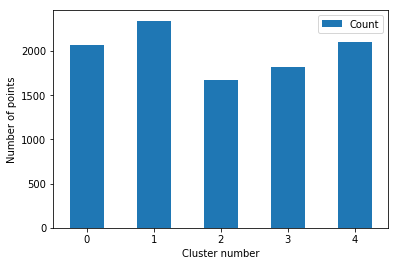

In [195]:
df_tfidf_5k_tr_a['clusters'] = clust_labels5

#Data Points per cluster.
CountStatus5 = pd.value_counts(df_tfidf_5k_tr_a['clusters'].values, sort=False)

#Bar plot with counts of points in each cluster
t = pd.DataFrame({'Cluster': range(0,5),'Count':CountStatus5})

ax = t.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

### Word Count for 5 Clusters

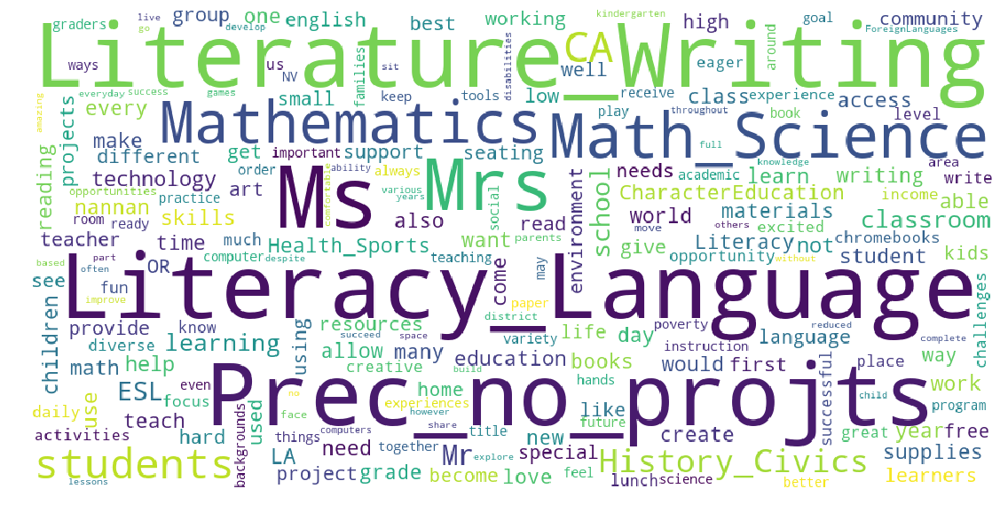

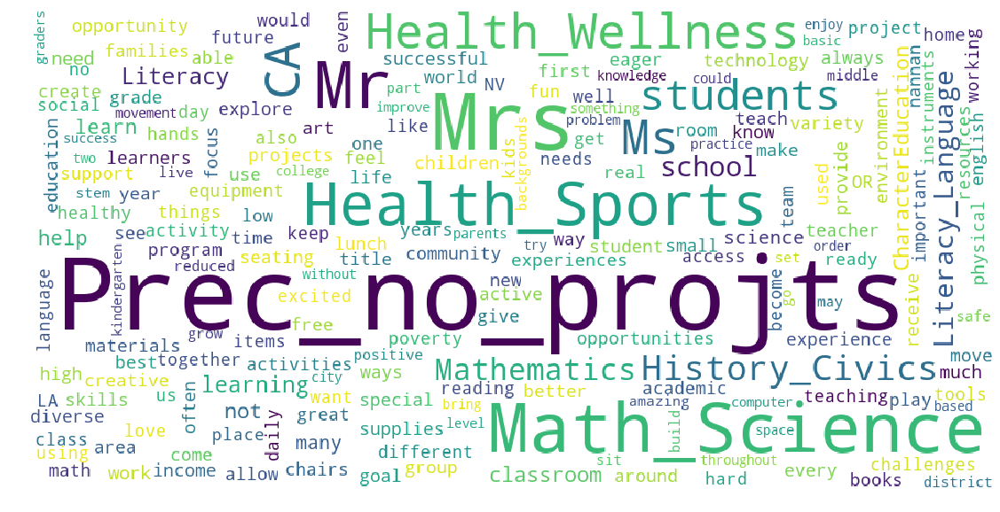

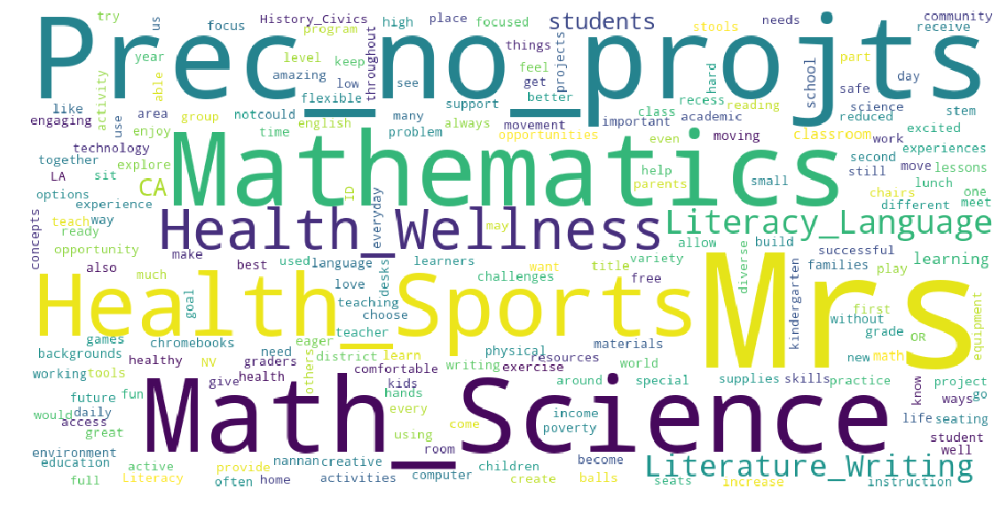

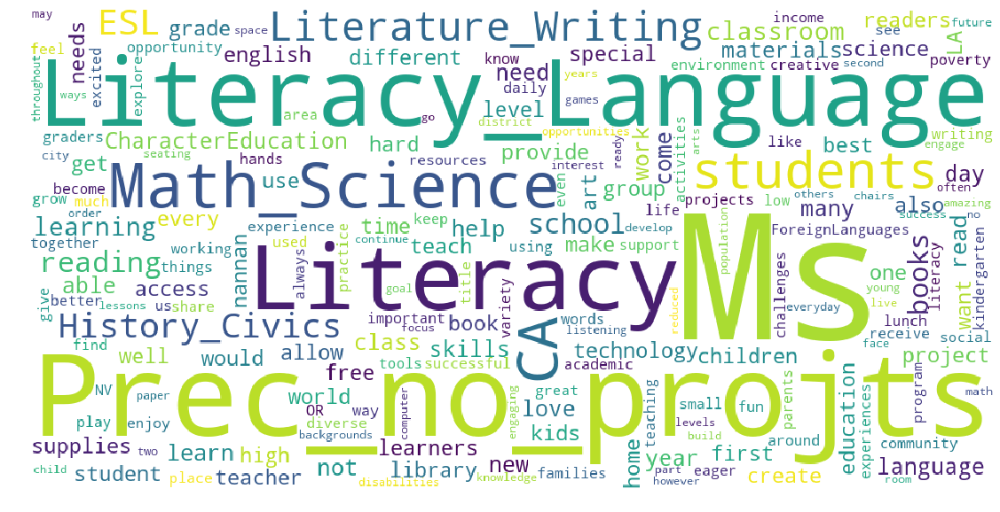

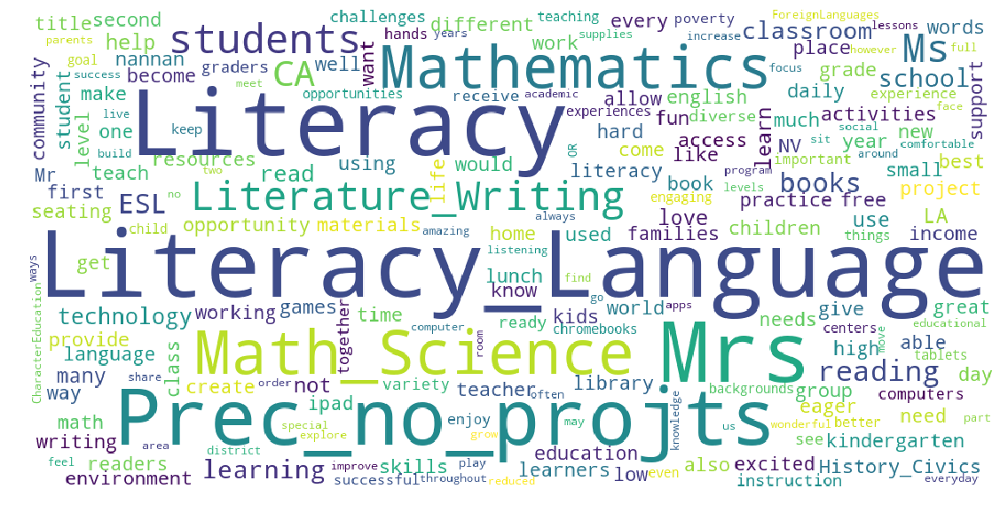

In [196]:
for i in range(0,5):
    clust = df_tfidf_5k_tr_a[df_tfidf_5k_tr_a['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

Cluster-0 :

- Most prominent words in the clusters are literacy_language,literature_writing,mathematics,math science etc.
- Here in this cluster it seems the words related to maths and technology writing are clustered used frequently.

Cluster-1:

- Most prominent words in the clusters are History_Geography,History_Civics,AppliedLearning,VisualArts,Literacy_Language
- Here in this cluster it seems words related to time like daily,history,first,second,year,day are used.

Cluster -2:

- Most prominent words in the clusters are Health_Sports ,Team_Sports,MS,yoga,seating,acitivty,sports,active, play,energy,play,move,moving,recess,flexible,movement.
- Here in this cluster it seems the words related to movement and sports are predominantly clustered.

Cluster-3:

- Most prominent words in the clusters are Math_Science , Mathematics ,Mrs,Prec_no_projts,Literacy_Language and Literacy.
- Here in this cluster it seems words related to math,learning,grade and books etc are used more.

Cluster-4:

- Most prominent words in the clusters are Literacy Language , literature,math science etc.
- Here in this cluster it seems here words focused on envionment, literrature , literacy.books are use frequently.

## Agglomerative Clustering: with n_clusters = 8

In [197]:
amodel8 = AgglomerativeClustering(n_clusters = 8 ,affinity='euclidean',linkage='ward')
amodel8.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels8 = amodel8.labels_

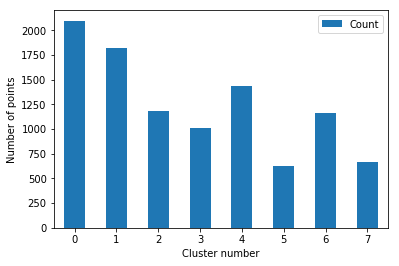

In [198]:
df_tfidf_5k_tr_a['clusters'] = clust_labels8

#Data Points per cluster.
CountStatus8 = pd.value_counts(df_tfidf_5k_tr_a['clusters'].values, sort=False)

#Bar plot with counts of points in each cluster
t = pd.DataFrame({'Cluster': range(0,8),'Count':CountStatus8})

ax = t.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

### Word count for all the 8 clusters

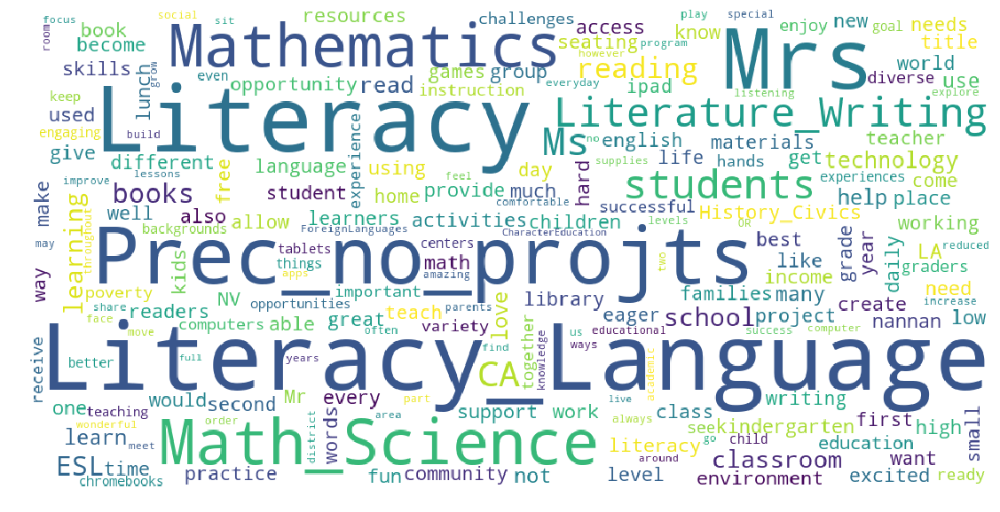

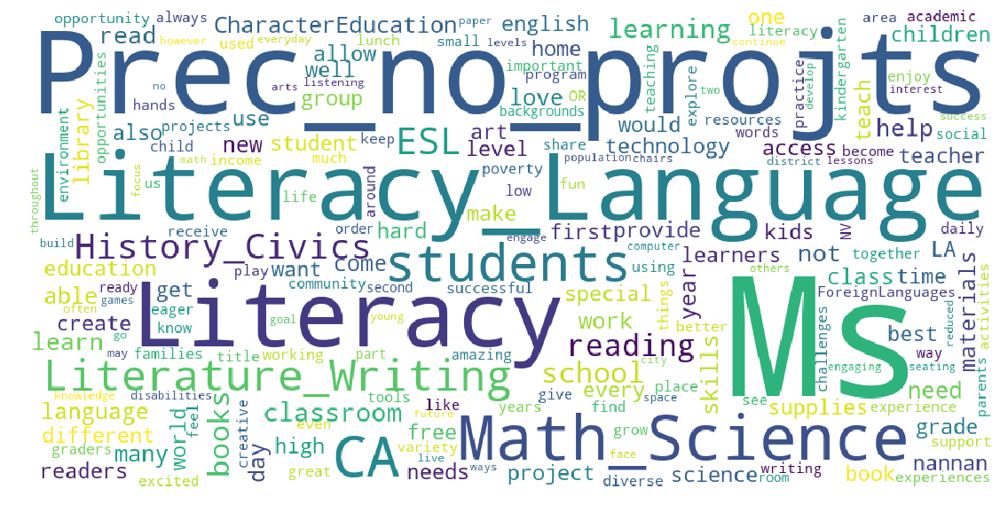

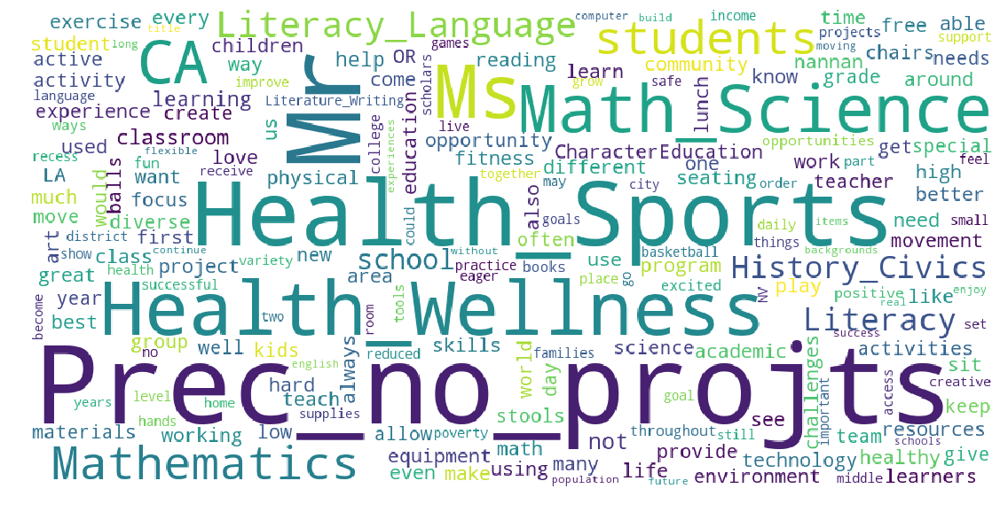

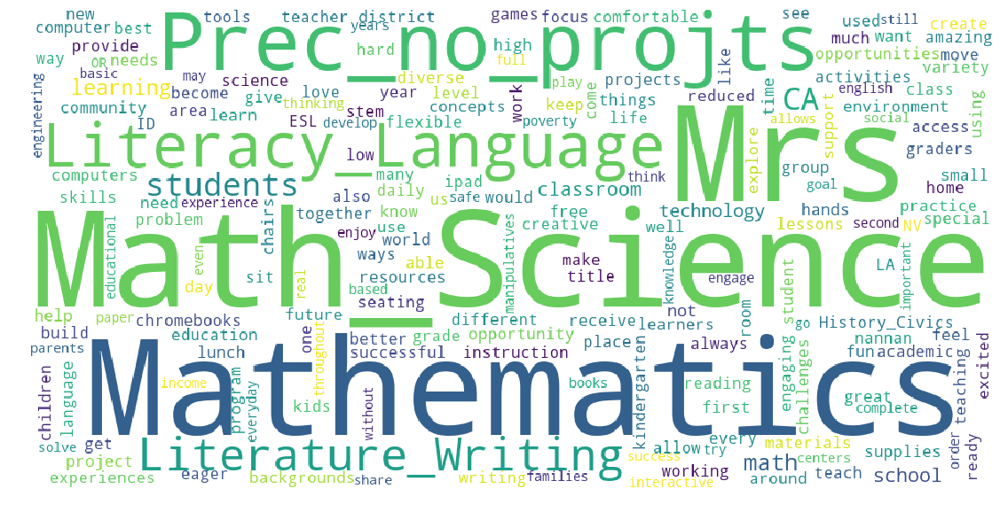

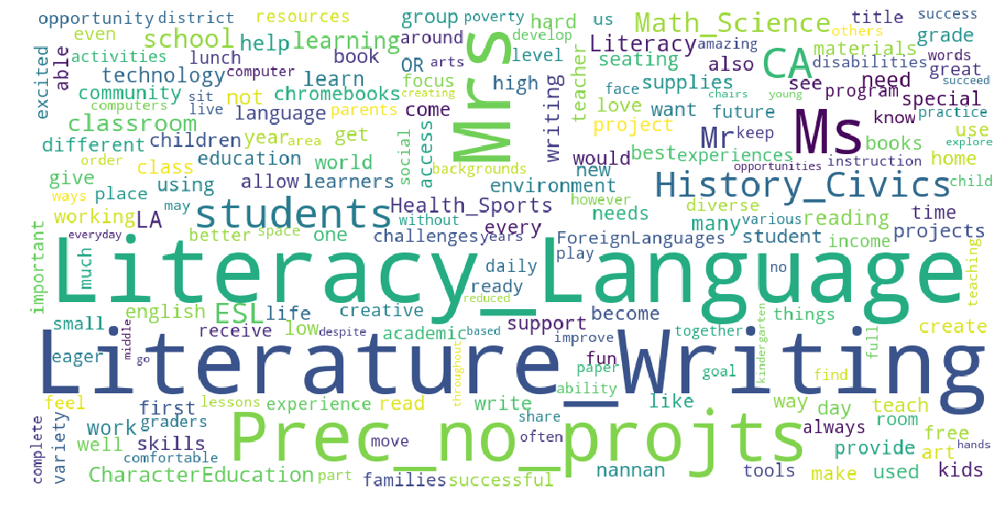

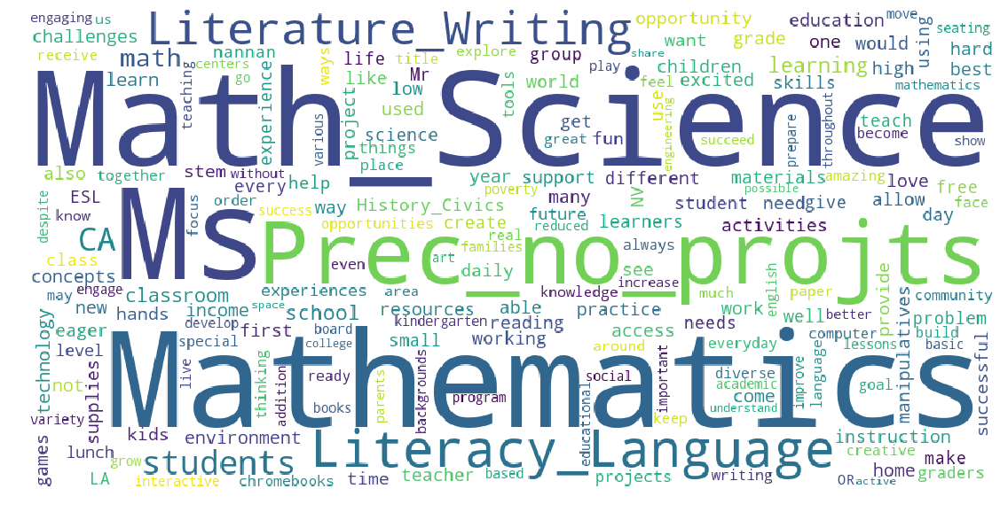

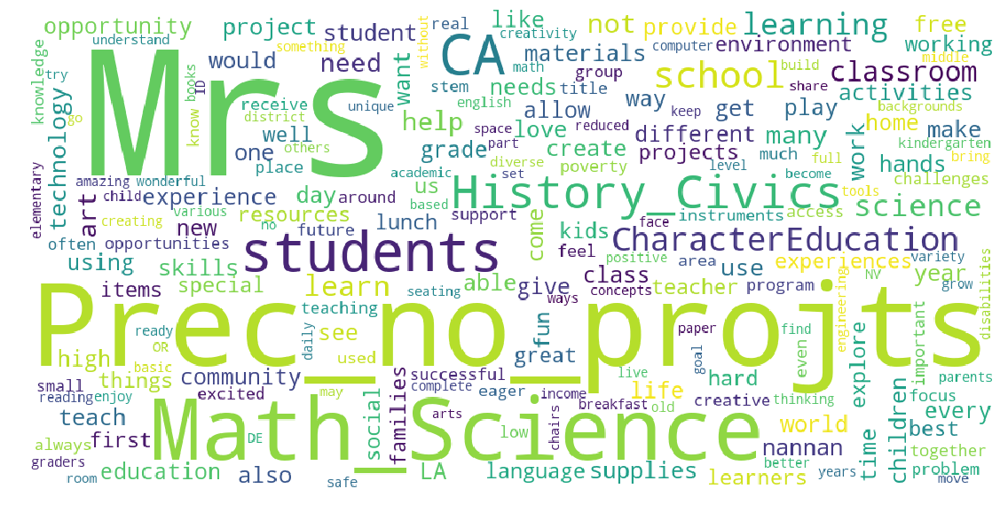

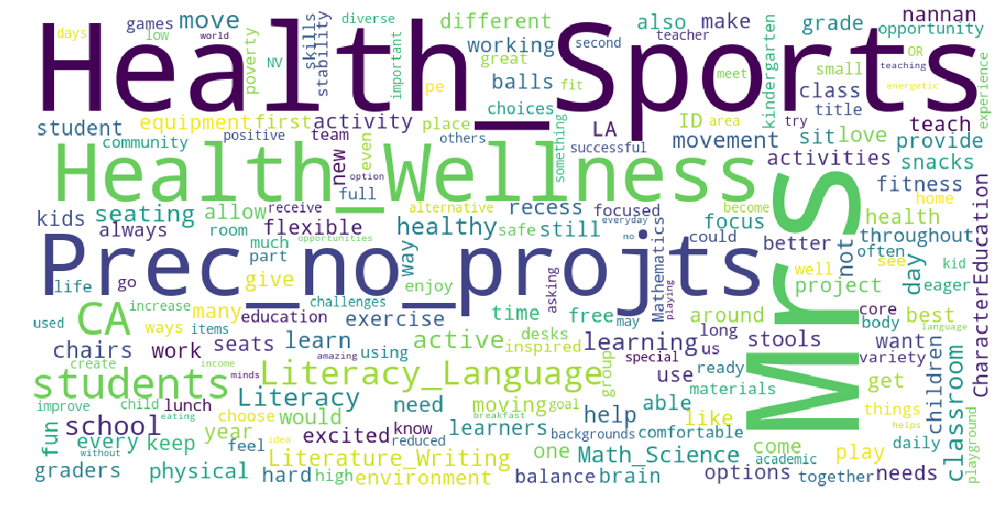

In [199]:
for i in range(0,8):
    clust = df_tfidf_5k_tr_a[df_tfidf_5k_tr_a['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

Cluster-0:
- Most prominent words in the clusters are MS,Prec_no_projts,Literacy_Language,library,excited.
- Here in this cluster it seems more foced on literacy and language and words related to that are clusterd together.

Cluster-1:
  - Most prominent words in the clusters are History_Geography,History_Civics,AppliedLearning,VisualArts,Literacy_Language
  - Here in this cluster it seems words related to time like daily,history,first,second,year,day are used.

Cluster-2:
  - Most prominent words in the clusters are History_Geography,History_Civics,AppliedLearning,VisualArts,Literacy_Language
  - Here in this cluster it seems words related to time like daily,history,first,second,year,day are used.
  
Cluster-3:
  - Most prominent words in the clusters are Math_Science , Mathematics ,Mrs,Prec_no_projts,Literacy_Language and Literacy.
  - Here in this cluster it seems words related to math,learning,grade and books etc are used more.
  
Cluster-4:
  - Most prominent words in the clusters are History_Geography,History_Civics,AppliedLearning,VisualArts,Literacy_Language
  - Here in this cluster it seems words related to time like daily,history,first,second,year,day are used.
  
Cluster-5:
  - Most prominent words in the clusters are literacy_language,literacy,students,reading,books,classrom,
    class,childrean,academics,learning,teacher,teach
  - Here in this cluster it seems words focused on teaching,student,reading,books etc are used more.
  
Cluster-6:
  - Most prominent words in the clusters are Special_Needs,Prec_no_projts,Literacy_Language and Literacy_Writing.
  - Here in this cluster it seems words related to place and location are clustered together like CA,LA,NY,DE etc

Cluster7:
  - Most prominent words in the clusters are Health_Sports ,Team_Sports,MS,yoga,seating,acitivty,sports,active,
    play,energy,play,move,moving,recess,flexible,movement.
  - Here in this cluster it seems the words related to movement and sports are predominantly clustered.

## DBSCAN

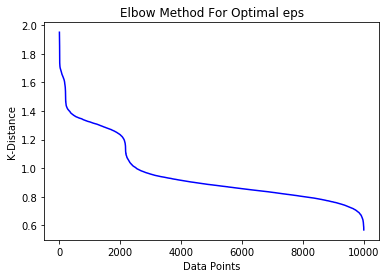

In [75]:
#https://stackoverflow.com/questions/48010276/how-to-estimate-eps-using-knn-distance-plot-in-dbscan

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

ns = 10
nbrs = NearestNeighbors(n_neighbors=ns).fit(df_tfidf_5k[0:10000])
distances, indices = nbrs.kneighbors(df_tfidf_5k[0:10000])
distanceDec = sorted(distances[:,ns-1], reverse=True)

plt.plot(list(range(1,10000+1)), distanceDec,'b-')

plt.xlabel('Data Points')
plt.ylabel('K-Distance')
plt.title('Elbow Method For Optimal eps')
plt.show()

### From the above plot the elbow point is at 1.0 so, eps optimal value is taken as 1.0

In [76]:
dmodel = DBSCAN(eps=1.0, min_samples=20, metric='euclidean',n_jobs= -1)

dmodel.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels_d = dmodel.labels_

In [97]:
df_tfidf_5k_tr_d = df_tfidf_5k[0:10000]

df_tfidf_5k_tr_d['clusters'] = clust_labels_d

#Data Points per cluster.
CountStatus_d = pd.value_counts(df_tfidf_5k_tr_d['clusters'].values, sort=False)

In [115]:
labels = np.array(list(dict(CountStatus_d).keys()))
count  = np.array(list(dict(CountStatus_d).values()))

t = pd.DataFrame(labels,columns=['Label'])
t['Count'] = pd.DataFrame(count,columns=['Count'])

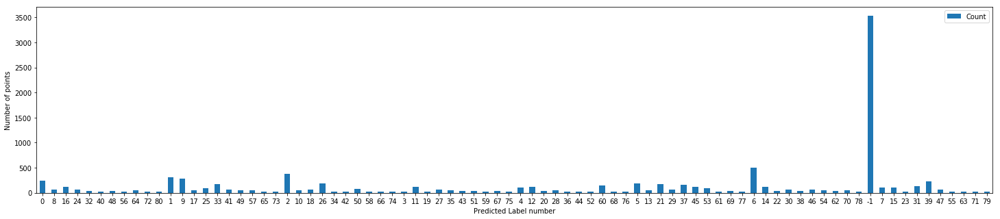

In [117]:
#Bar plot with counts of points in each cluster

ax = t.plot.bar(x='Label', y='Count', rot=0,figsize=(25,5))
plt.xlabel("Predicted Label number")
plt.ylabel("Number of points")
plt.show()

### Observation:
Here we are see the label = -1 has a very high number so these are the points that are noise points are not inlcuded in the cluster

### Noise points with n_neighbour = 10 and eps = 1.0 .The points that are labeled as -1

In [150]:
len(df_tfidf_5k_tr_d[df_tfidf_5k_tr_d['clusters'] == -1])

3531

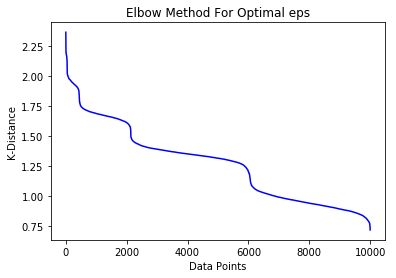

In [152]:
#https://stackoverflow.com/questions/48010276/how-to-estimate-eps-using-knn-distance-plot-in-dbscan

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

ns = 100
nbrs = NearestNeighbors(n_neighbors=ns).fit(df_tfidf_5k[0:10000])
distances, indices = nbrs.kneighbors(df_tfidf_5k[0:10000])
distanceDec = sorted(distances[:,ns-1], reverse=True)

plt.plot(list(range(1,10000+1)), distanceDec,'b-')

plt.xlabel('Data Points')
plt.ylabel('K-Distance')
plt.title('Elbow Method For Optimal eps')
plt.show()

### Model buidling with eps = 1.5

In [154]:
dmodel = DBSCAN(eps=1.5, min_samples=20, metric='euclidean',n_jobs= -1)

dmodel.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels_d = dmodel.labels_

In [156]:
df_tfidf_5k_tr_d = df_tfidf_5k[0:10000]

df_tfidf_5k_tr_d['clusters'] = clust_labels_d

#Data Points per cluster.
CountStatus_d = pd.value_counts(df_tfidf_5k_tr_d['clusters'].values, sort=False)

In [157]:
labels = np.array(list(dict(CountStatus_d).keys()))
count  = np.array(list(dict(CountStatus_d).values()))

t = pd.DataFrame(labels,columns=['Label'])
t['Count'] = pd.DataFrame(count,columns=['Count'])

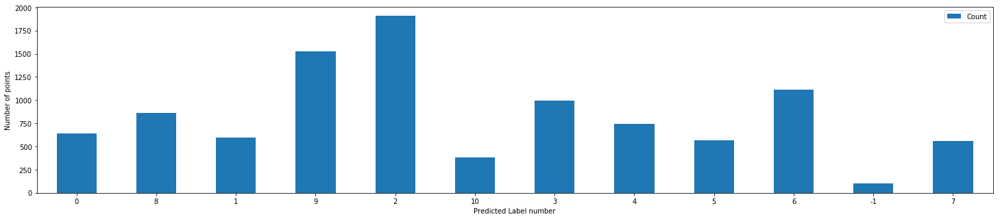

In [158]:
#Bar plot with counts of points in each cluster

ax = t.plot.bar(x='Label', y='Count', rot=0,figsize=(25,5))
plt.xlabel("Predicted Label number")
plt.ylabel("Number of points")
plt.show()

#### Still we can see label = -1 still has few points in it.We will need to make this value 0

In [161]:
len(df_tfidf_5k_tr_d[df_tfidf_5k_tr_d['clusters'] == -1])

101

### Model building with eps = 1.7

In [179]:
dmodel = DBSCAN(eps=1.7, min_samples=20, metric='euclidean',n_jobs= -1)

dmodel.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels_d = dmodel.labels_

In [180]:
df_tfidf_5k_tr_d = df_tfidf_5k[0:10000]

df_tfidf_5k_tr_d['clusters'] = clust_labels_d

#Data Points per cluster.
CountStatus_d = pd.value_counts(df_tfidf_5k_tr_d['clusters'].values, sort=False)

In [181]:
labels = np.array(list(dict(CountStatus_d).keys()))
count  = np.array(list(dict(CountStatus_d).values()))

t = pd.DataFrame(labels,columns=['Label'])
t['Count'] = pd.DataFrame(count,columns=['Count'])

In [182]:
t

,Label,Count
0,0,1442
1,8,383
2,1,599
3,2,1921
4,3,999
5,4,1436
6,5,1116
7,6,577
8,-1,1
9,7,1526


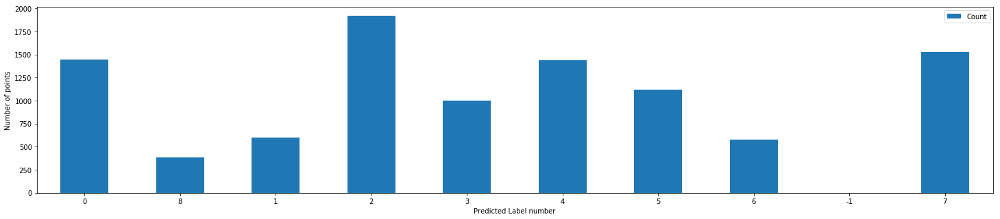

In [183]:
#Bar plot with counts of points in each cluster

ax = t.plot.bar(x='Label', y='Count', rot=0,figsize=(25,5))
plt.xlabel("Predicted Label number")
plt.ylabel("Number of points")
plt.show()

#### Observation :

As we can see in the plot above the value of points with label  = -1 is 1 now.
This shows with eps = 1.7 all the points are taken into the cluster.

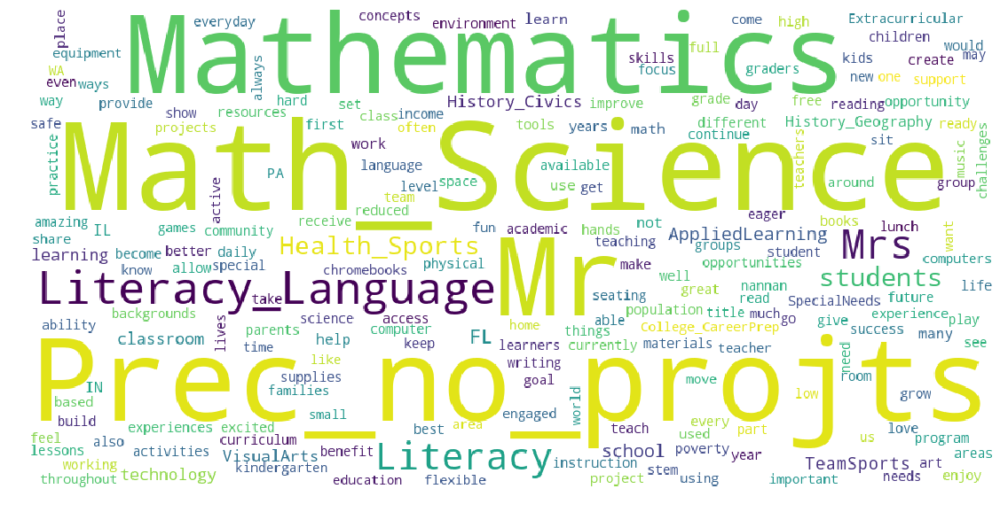

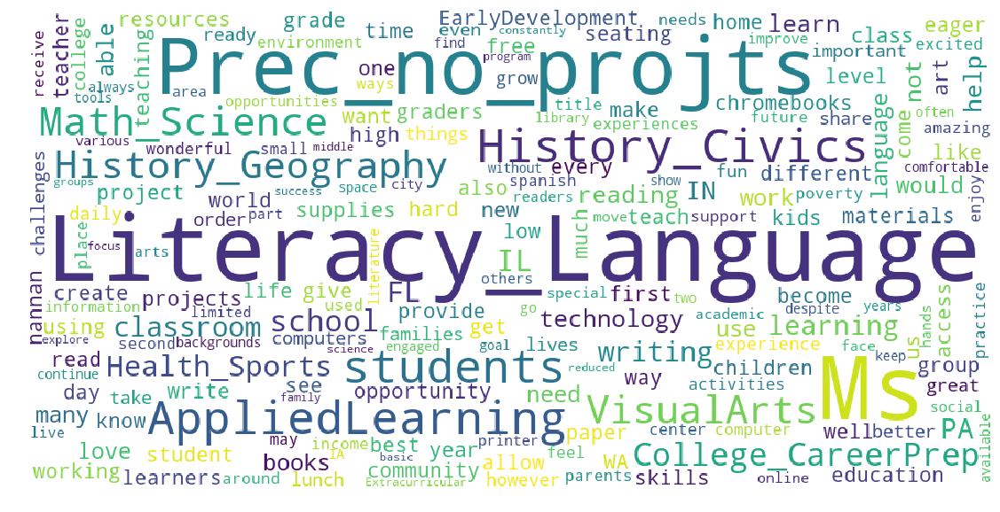

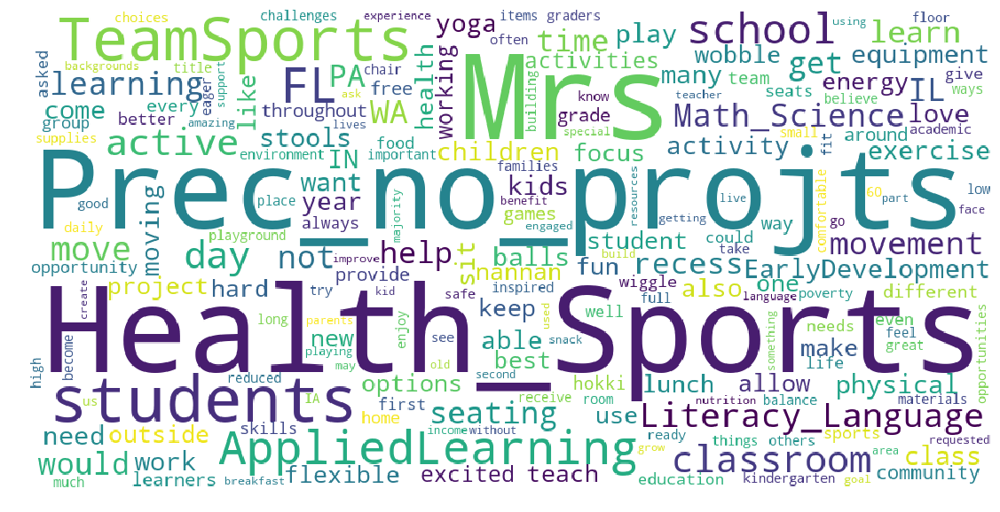

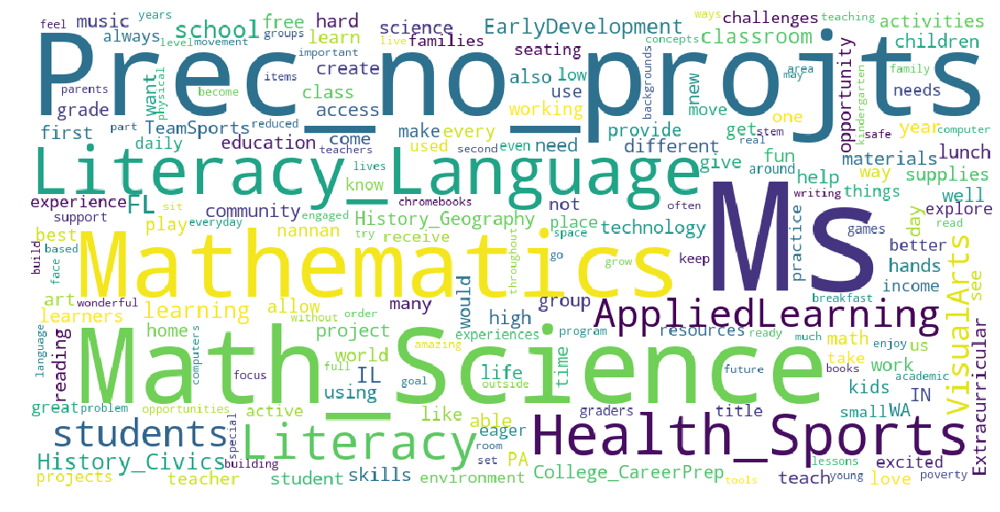

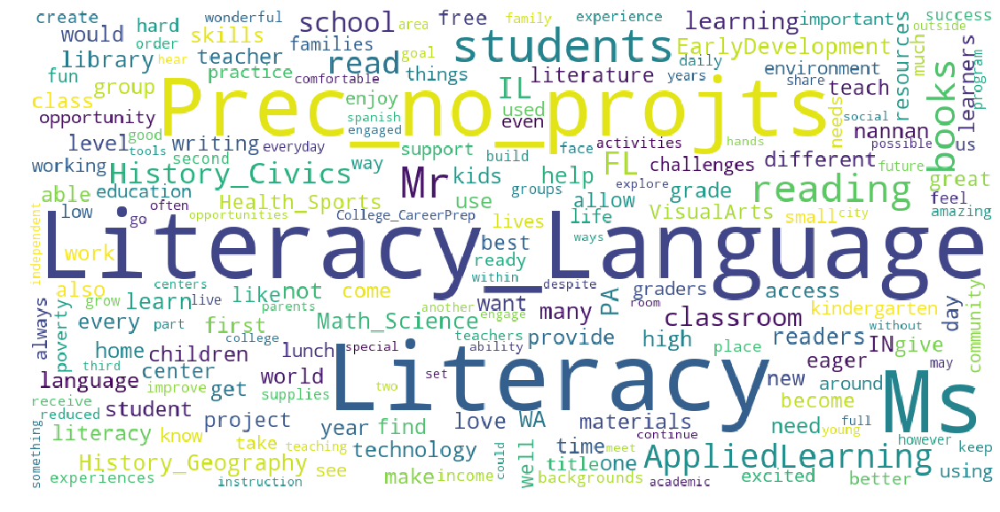

In [184]:
for i in labels[0:5]:
    clust = df_tfidf_5k_tr_d[df_tfidf_5k_tr_d['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
#Only print the word cloud for the dataframe where rows are present.    
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

Cluster-0 :

- Most prominent words in the clusters are literacy_language,literacy,students,reading,books,classrom, class,childrean,academics,learning,teacher,teach
- Here in this cluster it seems words focused on teaching,student,reading,books etc are used more.

Cluster-1:

- Most prominent words in the clusters are Visual Arts,Applied learning,Mathematics,math_science,Ms etc
- Here in this cluster it seems words related to coding,problem solving,desing etc are used.This gives a patern of more technology dependet words are used here.

Cluster2:

- Most prominent words in the clusters are Health_Sports ,Team_Sports,MS,yoga,seating,acitivty,sports,active, play,energy,play,move,moving,recess,flexible,movement.
- Here in this cluster it seems the words related to movement and sports are predominantly clustered.

Cluster-3:

- Most prominent words in the clusters are Maths,literacy,literature,science etc
- Here in this cluster it seems words related to applied learning are focused also history and civics.

Cluster-4:

- Most prominent words in the clusters are SpeacialNeeds,Students,social,skills,Ms,needs
- Here in this cluster it seems here words has patern of skill development,scial needs, and need of the students for education and learn technology.

### Conclusion:

In [195]:
# Compare all your models using Prettytable library
#http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Vectorizer","Clusters","K","eps"]

x_pretty_table.add_row([ "K-Means","TFIDF",12,12, 0.69])
x_pretty_table.add_row([ "Agglomerative Clustering","TFIDF",'2,5,8','',''])
x_pretty_table.add_row([ "DBSCAN","TFIDF",100,'','1.0,1.5,1.7'])


print(x_pretty_table)

+--------------------------+------------+----------+----+-------------+
|        Model Type        | Vectorizer | Clusters | K  |     eps     |
+--------------------------+------------+----------+----+-------------+
|         K-Means          |   TFIDF    |    12    | 12 |     0.69    |
| Agglomerative Clustering |   TFIDF    |  2,5,8   |    |             |
|          DBSCAN          |   TFIDF    |   100    |    | 1.0,1.5,1.7 |
+--------------------------+------------+----------+----+-------------+
